### Import packages 

In [162]:
import pandas as pd
import numpy as np

from sklearn.cluster import KMeans
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import silhouette_score
from yellowbrick.cluster import SilhouetteVisualizer
from sklearn.metrics import pairwise_distances
from sklearn.decomposition import PCA

import plotly.graph_objects as go

import matplotlib.pyplot as plt
import seaborn as sns

import re 

import warnings
warnings.filterwarnings('ignore')

random_seed = 101

### Read the data

In [163]:
df = pd.read_csv("Data/6.3.3_spotify_5000_songs.csv")
df.head()

,Unnamed: 0,name,artist,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,type,duration_ms,time_signature,id,html
0,0,Se Eu Quiser Falar Com Deus ...,Gilberto Gil,0.658,0.2590,11,-13.141,0,0.0705,0.694,0.000059,0.975,0.306,110.376,,256213,4,1n7JnwviZ7zf0LR1tcGFq7,https://open.spotify.com/track/1n7JnwviZ7zf0LR...
1,1,Saudade De Bahia ...,Antônio Carlos Jobim,0.742,0.3990,2,-12.646,1,0.0346,0.217,0.000002,0.107,0.693,125.039,,191867,4,5QGM1U0eCYrQuwSJwTm5Zq,https://open.spotify.com/track/5QGM1U0eCYrQuwS...
2,2,"Canta Canta, Minha Gente ...",Martinho Da Vila,0.851,0.7300,2,-11.048,1,0.3470,0.453,0.000063,0.124,0.905,93.698,,152267,4,0NLIFSZxPzQhCwnkn5PJYs,https://open.spotify.com/track/0NLIFSZxPzQhCwn...
3,3,Mulher Eu Sei ...,Chico César,0.705,0.0502,4,-18.115,1,0.0471,0.879,0.000041,0.386,0.524,106.802,,186227,4,3mXqOdlLE1k67WsAxryPFs,https://open.spotify.com/track/3mXqOdlLE1k67Ws...
4,4,Rosa Morena ...,Kurt Elling,0.651,0.1190,6,-19.807,1,0.0380,0.916,0.000343,0.104,0.402,120.941,,273680,4,7bSzjzjTkWT2CkIPPdp0eA,https://open.spotify.com/track/7bSzjzjTkWT2CkI...


### Data cleaning

In [164]:
df.columns

Index(['Unnamed: 0',
       'name                                                                                                                                                                             ',
       'artist                                          ', 'danceability ',
       'energy   ', 'key ', 'loudness ', 'mode ', 'speechiness ',
       'acousticness ', 'instrumentalness ', 'liveness ', 'valence ',
       'tempo   ', 'type ', 'duration_ms ', 'time_signature ',
       'id                     ', 'html'],
      dtype='object')

In [165]:
# Clean spaces in column names
df.columns = df.columns.str.replace(" ", "")
df.columns

Index(['Unnamed:0', 'name', 'artist', 'danceability', 'energy', 'key',
       'loudness', 'mode', 'speechiness', 'acousticness', 'instrumentalness',
       'liveness', 'valence', 'tempo', 'type', 'duration_ms', 'time_signature',
       'id', 'html'],
      dtype='object')

In [166]:
# Drop unnecessary spaces from song and artist names
df['name'] = df['name'].str.strip()
df['artist'] = df['artist'].str.strip()

# Drop 'Unnamed:0'
df = df.drop(columns=['Unnamed:0'], axis=1)

# Check for duplicates
duplicate_rows = df[df.duplicated(["id"], keep="first")]
# pd.DataFrame(duplicate_rows)
print("The total num of duplicates is: ", len(duplicate_rows))

The total num of duplicates is:  64


In [167]:
# Create a copy
df2 = df.copy()

# Drop duplicates
df2.duplicated().value_counts()
df2 = df2.drop_duplicates()

In [168]:
# Set index
df2 = df2.set_index("id")

In [169]:
df2.info()
# No missing, but 2 non-numerical columns "type" and "html"

<class 'pandas.core.frame.DataFrame'>
Index: 5171 entries, 1n7JnwviZ7zf0LR1tcGFq7  to 7E1ErYYCn0lYjHODZ1qGuB 
Data columns (total 17 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   name              5171 non-null   object 
 1   artist            5171 non-null   object 
 2   danceability      5171 non-null   float64
 3   energy            5171 non-null   float64
 4   key               5171 non-null   int64  
 5   loudness          5171 non-null   float64
 6   mode              5171 non-null   int64  
 7   speechiness       5171 non-null   float64
 8   acousticness      5171 non-null   float64
 9   instrumentalness  5171 non-null   float64
 10  liveness          5171 non-null   float64
 11  valence           5171 non-null   float64
 12  tempo             5171 non-null   float64
 13  type              5171 non-null   object 
 14  duration_ms       5171 non-null   int64  
 15  time_signature    5171 non-null   int64  
 16  html  

In [170]:
# Function to remove outliers using IQR method
def remove_outliers_iqr(df, col, multiplier=1.5):
    Q1 = df[col].quantile(0.25)
    Q3 = df[col].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - multiplier * IQR
    upper_bound = Q3 + multiplier * IQR
    return df.loc[(df[col] >= lower_bound) & (df[col] <= upper_bound)]

In [171]:
col_list_complete = ['danceability', 'energy', 'key', 'loudness', 'mode', 'speechiness', 'acousticness', 'instrumentalness', 'liveness', 'valence', 'tempo']

# Remove outliers for each column
for col in df2[col_list_complete]:
    df3 = remove_outliers_iqr(df2, col, multiplier=1.5)

# Calculate the percentage of data retained
percentage_retained = (len(df3) / len(df2)) * 100

# Display the results
print(f"Number of rows before removing outliers: {len(df2)}")
print(f"Number of rows after removing outliers: {len(df3)}")
print(f"Percentage of data retained: {percentage_retained:.2f}%")

Number of rows before removing outliers: 5171
Number of rows after removing outliers: 5122
Percentage of data retained: 99.05%


In [172]:
df3.columns

Index(['name', 'artist', 'danceability', 'energy', 'key', 'loudness', 'mode',
       'speechiness', 'acousticness', 'instrumentalness', 'liveness',
       'valence', 'tempo', 'type', 'duration_ms', 'time_signature', 'html'],
      dtype='object')

### Scaling the data

In [173]:
df3_new = df3.loc[:, col_list_complete]
print(df3_new.columns)
scaler = MinMaxScaler().set_output(transform="pandas")
df3_minmax_test = scaler.fit_transform(df3_new)
df3_minmax_test

Index(['danceability', 'energy', 'key', 'loudness', 'mode', 'speechiness',
       'acousticness', 'instrumentalness', 'liveness', 'valence', 'tempo'],
      dtype='object')


,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo
id,,,,,,,,,,,
1n7JnwviZ7zf0LR1tcGFq7,0.659467,0.258985,1.000000,0.683418,0.0,0.053496,0.696787,0.000060,0.987706,0.296665,0.456665
5QGM1U0eCYrQuwSJwTm5Zq,0.752039,0.398988,0.181818,0.694238,1.0,0.013402,0.217871,0.000002,0.098453,0.697535,0.555779
0NLIFSZxPzQhCwnkn5PJYs,0.872162,0.729995,0.181818,0.729168,1.0,0.362296,0.454819,0.000064,0.115869,0.917133,0.343930
3mXqOdlLE1k67WsAxryPFs,0.711263,0.050181,0.363636,0.574692,1.0,0.027362,0.882530,0.000041,0.384284,0.522478,0.432506
7bSzjzjTkWT2CkIPPdp0eA,0.651752,0.118982,0.545455,0.537707,1.0,0.017199,0.919679,0.000348,0.095380,0.396105,0.528079
...,...,...,...,...,...,...,...,...,...,...,...
1aEhYlZtypmipA06SDJ4U3,0.156932,0.069381,0.272727,0.459386,1.0,0.027585,0.920683,0.725888,0.074070,0.047545,0.304779
1Gfqe7TAKklmuZf6hxsH6h,0.141503,0.100982,0.545455,0.492546,1.0,0.024123,0.858434,0.432487,0.059932,0.016470,0.272523
2XNwnFrdMDpismp0VUZ7cU,0.000000,0.000910,0.818182,0.031630,1.0,0.023230,0.954819,0.983756,0.067923,0.015330,0.194376


In [174]:
# Initialise the model
my_kmeans = KMeans(n_clusters= 3, # you always choose the number of k here
                   n_init="auto",
                   random_state = 123)

# Fit the model to the data
my_kmeans.fit(df3_minmax_test)

# Obtain the cluster output
clusters = my_kmeans.labels_

# Attach the cluster output to our clusters_df DataFrame
df3_minmax_test["cluster"] = clusters

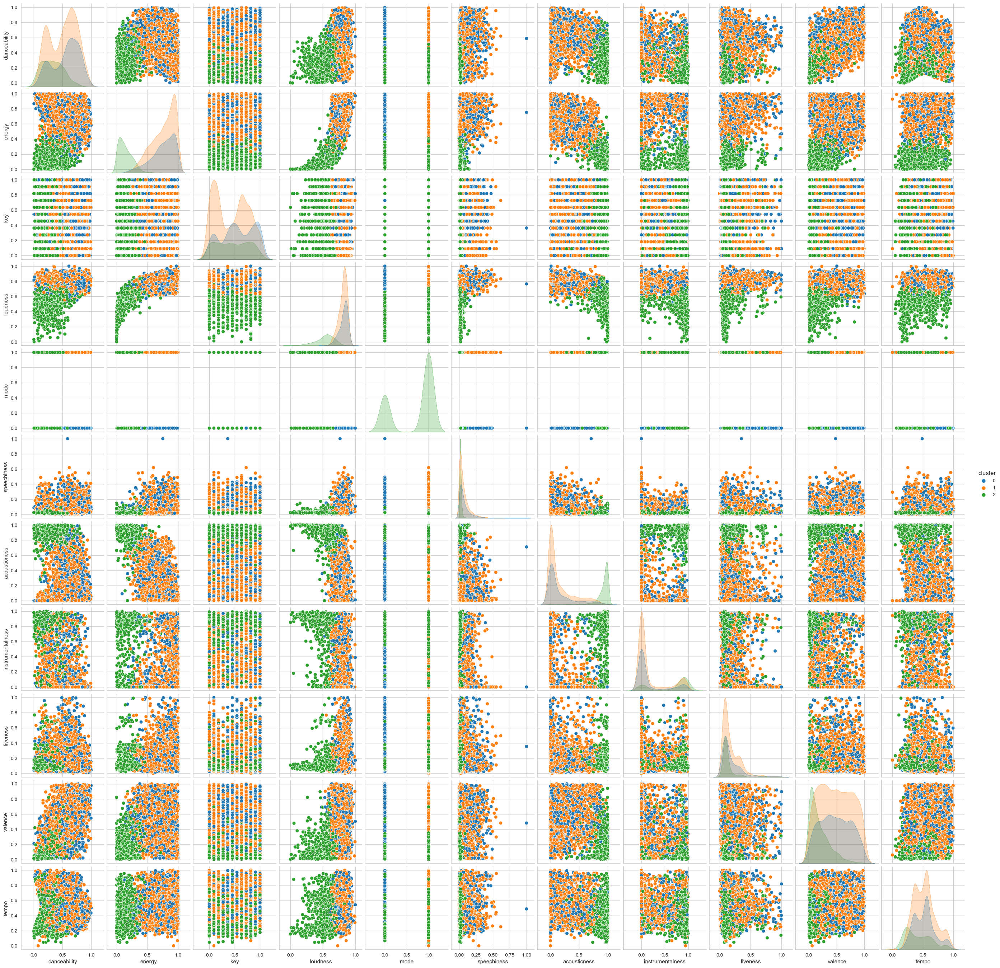

In [175]:

sns.pairplot(df3_minmax_test, hue="cluster", palette="tab10")

In [176]:
df3_minmax_test.columns
df3_minmax_test1  =df3_minmax_test.loc[:, ['danceability', 'energy', 'acousticness', 'instrumentalness', 'cluster']]
df3_minmax_test2  =df3_minmax_test.loc[:, ['loudness', 'speechiness', 'liveness', 'valence', 'tempo', 'cluster']]

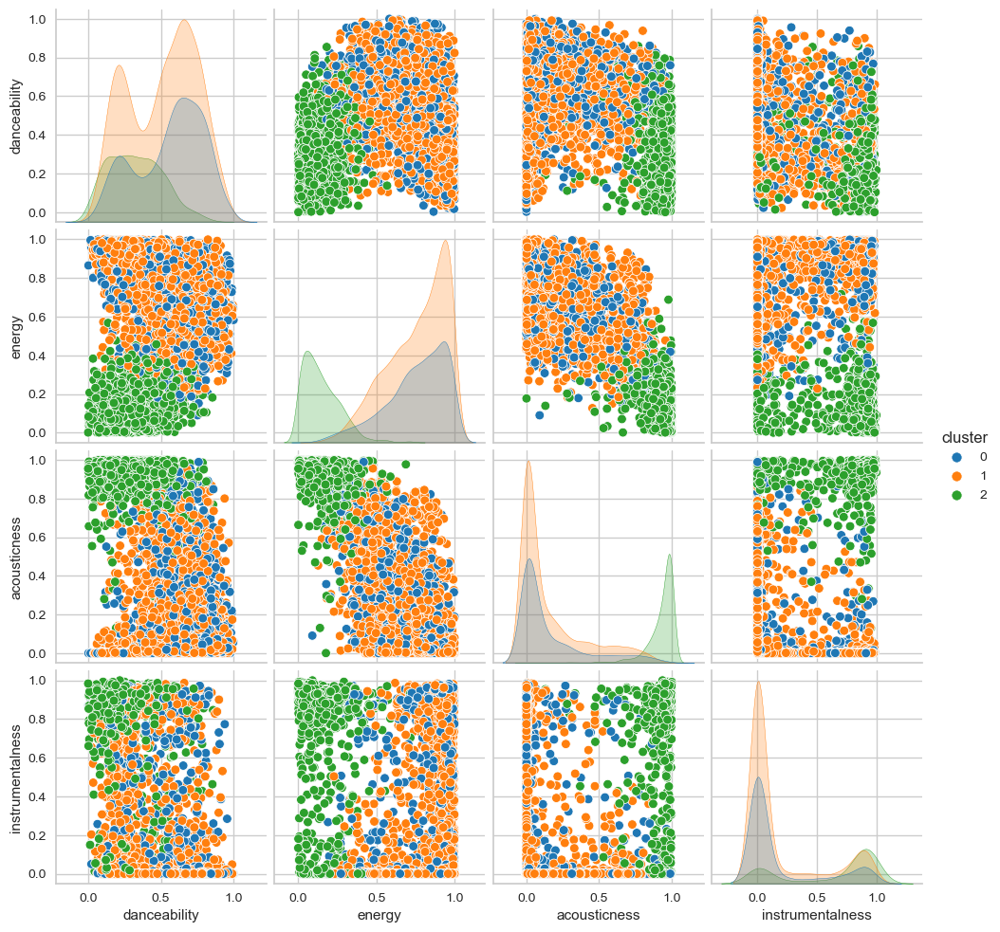

In [177]:
sns.pairplot(df3_minmax_test1, hue="cluster", palette="tab10")

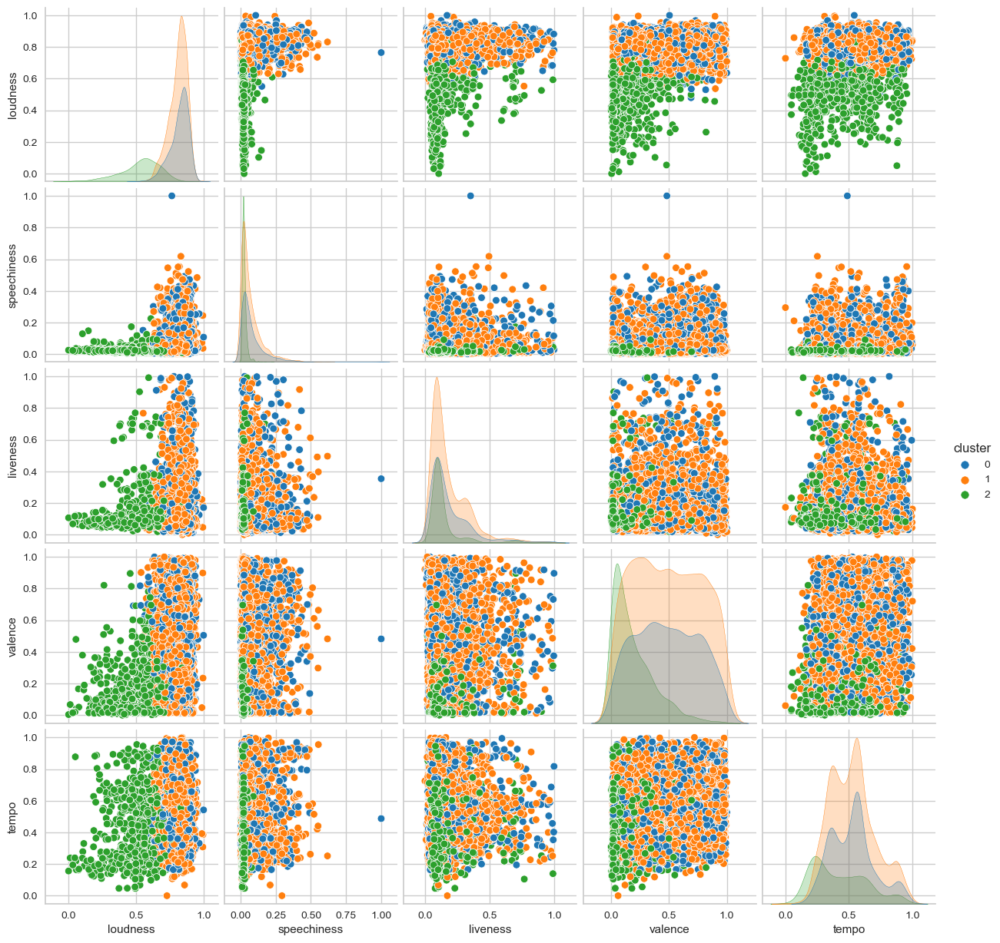

In [178]:
sns.pairplot(df3_minmax_test2, hue="cluster", palette="tab10")

In [179]:
# Create a PCA object
pca_variance = PCA(n_components=0.95)

# Fit the PCA object to the scaled features dataframe and transform it
pca_variance_df = pca_variance.fit_transform(df3_minmax_test)

# The dataframe now contains the principal components of the scaled features dataframe
pca_variance_df

# Initialise the model
my_kmeans = KMeans(n_clusters= 5, # you always choose the number of k here
                   n_init="auto",
                   random_state = 123)

# Fit the model to the data
my_kmeans.fit(pca_variance_df)

# Obtain the cluster output
clusters = my_kmeans.labels_

# Attach the cluster output to our clusters_df DataFrame
df3_minmax_test["PCA - 0.95"] = clusters

df3_minmax_test

,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,cluster,PCA - 0.95
id,,,,,,,,,,,,,
1n7JnwviZ7zf0LR1tcGFq7,0.659467,0.258985,1.000000,0.683418,0.0,0.053496,0.696787,0.000060,0.987706,0.296665,0.456665,0,4
5QGM1U0eCYrQuwSJwTm5Zq,0.752039,0.398988,0.181818,0.694238,1.0,0.013402,0.217871,0.000002,0.098453,0.697535,0.555779,1,1
0NLIFSZxPzQhCwnkn5PJYs,0.872162,0.729995,0.181818,0.729168,1.0,0.362296,0.454819,0.000064,0.115869,0.917133,0.343930,1,1
3mXqOdlLE1k67WsAxryPFs,0.711263,0.050181,0.363636,0.574692,1.0,0.027362,0.882530,0.000041,0.384284,0.522478,0.432506,2,2
7bSzjzjTkWT2CkIPPdp0eA,0.651752,0.118982,0.545455,0.537707,1.0,0.017199,0.919679,0.000348,0.095380,0.396105,0.528079,2,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1aEhYlZtypmipA06SDJ4U3,0.156932,0.069381,0.272727,0.459386,1.0,0.027585,0.920683,0.725888,0.074070,0.047545,0.304779,2,2
1Gfqe7TAKklmuZf6hxsH6h,0.141503,0.100982,0.545455,0.492546,1.0,0.024123,0.858434,0.432487,0.059932,0.016470,0.272523,2,2
2XNwnFrdMDpismp0VUZ7cU,0.000000,0.000910,0.818182,0.031630,1.0,0.023230,0.954819,0.983756,0.067923,0.015330,0.194376,2,2


In [180]:
df3_minmax_test2 = df3_minmax_test.drop(columns=['cluster', 'PCA - 0.95'], axis=1)

In [181]:
from sklearn.decomposition import PCA
import pandas as pd

# Assuming df3_minmax_test2 is your scaled features dataframe
pca_variance = PCA(n_components=0.95)

# Fit the PCA object to the scaled features dataframe and transform it
pca_variance_df = pca_variance.fit_transform(df3_minmax_test2)

# Get the loadings of each principal component
loadings = pca_variance.components_

# Calculate the contributions of each original feature to each principal component
contributions = pd.DataFrame(index=df3_minmax_test2.columns)

for i in range(pca_variance.n_components_):
    contribution_i = loadings[i, :] * (pca_variance.explained_variance_ratio_[i] ** 0.5)
    contributions[f'PC_{i+1}'] = contribution_i

# Print or visualize the DataFrame
print(contributions)


                      PC_1      PC_2      PC_3      PC_4      PC_5      PC_6  \
danceability     -0.141786 -0.018445 -0.145324 -0.009498  0.079714 -0.038151   
energy           -0.213625 -0.053883  0.185191 -0.007217  0.010153  0.002835   
key              -0.036622  0.091124  0.013083  0.324416  0.016581 -0.001114   
loudness         -0.115993 -0.027323  0.032489 -0.002213 -0.005470  0.001764   
mode              0.133547 -0.477993  0.010980  0.062840  0.007165 -0.002836   
speechiness      -0.018823 -0.001102  0.016863  0.000719 -0.004214 -0.002956   
acousticness      0.276062  0.062073 -0.229004  0.012009 -0.003694  0.030585   
instrumentalness  0.273114  0.084209  0.221462 -0.018204  0.157145 -0.008468   
liveness         -0.019377 -0.003109  0.016083  0.004010 -0.013136  0.011930   
valence          -0.171626 -0.053570 -0.152796 -0.011949  0.170675  0.015387   
tempo            -0.041197 -0.011335  0.027233 -0.000988  0.010999  0.183884   

                      PC_7  
danceabili

For first component *PC_1*, "acousticness" (0.276062) and "instrumentalness" (0.273114) show the highest positive loadings and "energy" (-0.213625) and "valence" (-0.171626) showing the negative loadings.

### First round of clustering
The above pairplot indicates that the following four columns can be very helpful in creating distinct clusters: 'danceability', 'energy', and 'acousticness', 'instrumentalness'

In [182]:
# Let's list the distinctive four columns
col_list = ['danceability', 'energy', 'acousticness', 'instrumentalness']#, 'valence']

# Scale the data
df3_new = df3.loc[:, col_list]
print(df3_new.columns)
scaler = MinMaxScaler().set_output(transform="pandas")
df3_minmax = scaler.fit_transform(df3_new)
df3_minmax

Index(['danceability', 'energy', 'acousticness', 'instrumentalness'], dtype='object')


,danceability,energy,acousticness,instrumentalness
id,,,,
1n7JnwviZ7zf0LR1tcGFq7,0.659467,0.258985,0.696787,0.000060
5QGM1U0eCYrQuwSJwTm5Zq,0.752039,0.398988,0.217871,0.000002
0NLIFSZxPzQhCwnkn5PJYs,0.872162,0.729995,0.454819,0.000064
3mXqOdlLE1k67WsAxryPFs,0.711263,0.050181,0.882530,0.000041
7bSzjzjTkWT2CkIPPdp0eA,0.651752,0.118982,0.919679,0.000348
...,...,...,...,...
1aEhYlZtypmipA06SDJ4U3,0.156932,0.069381,0.920683,0.725888
1Gfqe7TAKklmuZf6hxsH6h,0.141503,0.100982,0.858434,0.432487
2XNwnFrdMDpismp0VUZ7cU,0.000000,0.000910,0.954819,0.983756


In [183]:
# Create a PCA object
pca_variance = PCA(n_components=0.95)

# Fit the PCA object to the scaled features dataframe and transform it
pca_variance_df = pca_variance.fit_transform(df3_minmax)

# The dataframe now contains the principal components of the scaled features dataframe
pca_variance_df

array([[ 0.30594787, -0.5658172 ,  0.01932218],
       [-0.10485176, -0.35497641,  0.14465958],
       [-0.14103344, -0.3844797 ,  0.1941553 ],
       ...,
       [ 1.2384054 ,  0.22848097, -0.14520996],
       [ 0.93086999, -0.12009633, -0.27221347],
       [ 0.78811607, -0.17880822, -0.05597782]])

In [184]:
# Initialise the model
my_kmeans = KMeans(n_clusters= 5, # you always choose the number of k here
                   n_init="auto",
                   random_state = 123)

# Fit the model to the data
my_kmeans.fit(pca_variance_df)

# Obtain the cluster output
clusters = my_kmeans.labels_

# Attach the cluster output to our clusters_df DataFrame
df3_minmax["PCA - 0.95"] = clusters

df3_minmax

,danceability,energy,acousticness,instrumentalness,PCA - 0.95
id,,,,,
1n7JnwviZ7zf0LR1tcGFq7,0.659467,0.258985,0.696787,0.000060,3
5QGM1U0eCYrQuwSJwTm5Zq,0.752039,0.398988,0.217871,0.000002,0
0NLIFSZxPzQhCwnkn5PJYs,0.872162,0.729995,0.454819,0.000064,0
3mXqOdlLE1k67WsAxryPFs,0.711263,0.050181,0.882530,0.000041,3
7bSzjzjTkWT2CkIPPdp0eA,0.651752,0.118982,0.919679,0.000348,3
...,...,...,...,...,...
1aEhYlZtypmipA06SDJ4U3,0.156932,0.069381,0.920683,0.725888,1
1Gfqe7TAKklmuZf6hxsH6h,0.141503,0.100982,0.858434,0.432487,1
2XNwnFrdMDpismp0VUZ7cU,0.000000,0.000910,0.954819,0.983756,1


### Elbow and Silhouette score methods to select number of clusters

In [185]:
wcss = [] 
sil_scores = []
for i in range(2, 20): 
    kmeans = KMeans(n_clusters = i, init = 'k-means++', random_state = random_seed)
    kmeans.fit(df3_minmax) 
    wcss.append(kmeans.inertia_)
    # Calculate the silhouette score
    score = silhouette_score(df3_minmax, kmeans.labels_)
    # Append the silhouette score to the list
    sil_scores.append(score)

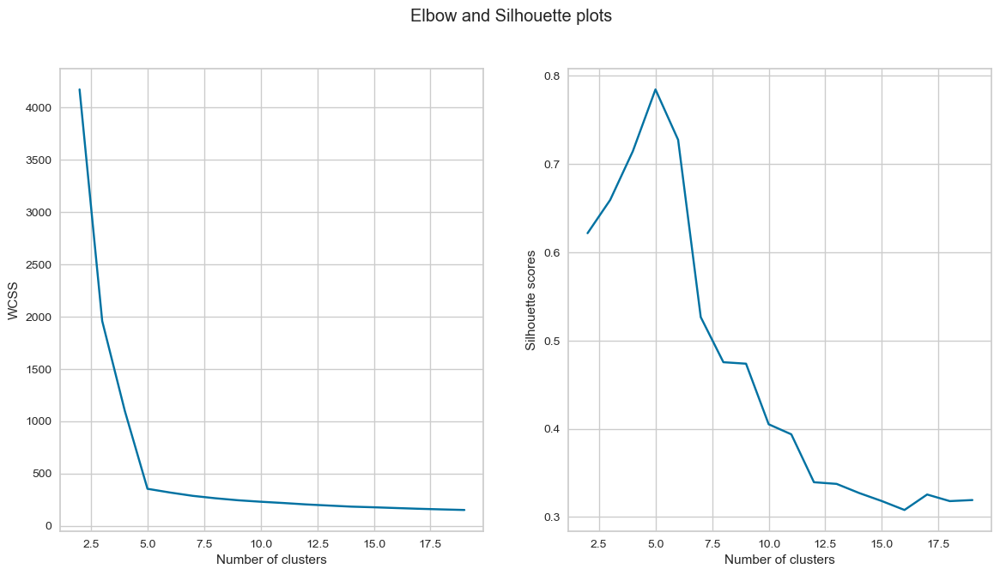

In [186]:
# Plot the Elbow and Silhouette scores plots
fig, axs = plt.subplots(1, 2, figsize=(14,7))
fig.suptitle('Elbow and Silhouette plots')
axs[0].plot(range(2, 20), wcss)
axs[0].set_xlabel('Number of clusters')
axs[0].set_ylabel('WCSS') 

axs[1].plot(range(2, 20), sil_scores)
axs[1].set_xlabel('Number of clusters')
axs[1].set_ylabel('Silhouette scores')
plt.show()

At n_clusters = 5, the inertia scores observe a sharp decline, the curve flattens afterward. 5 looks to be right amount of clusters for clustering. 

At n_clusters = 5, the Silhouette score also peaks. 

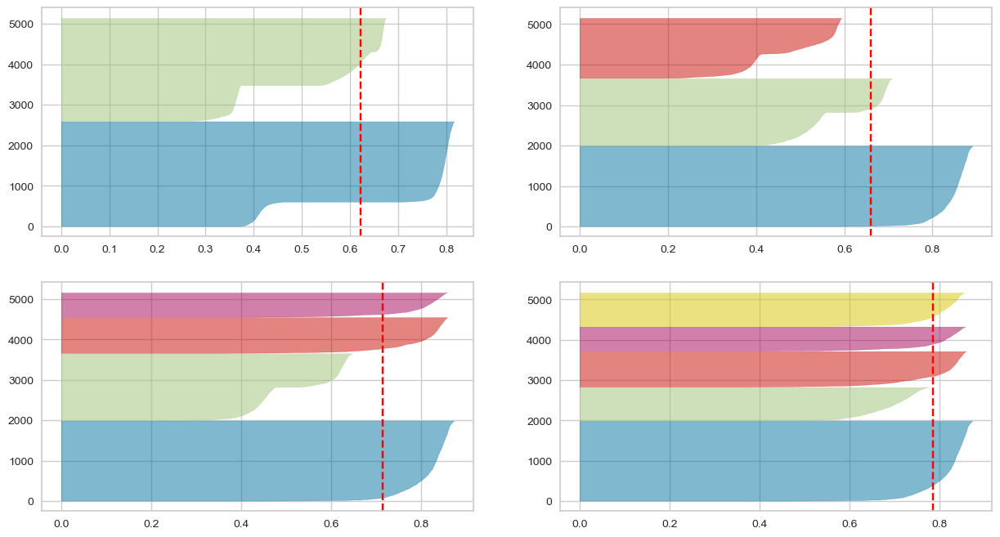

In [187]:
# Another approach at Silhouette plots
# source: https://vitalflux.com/kmeans-silhouette-score-explained-with-python-example/ 
fig, ax = plt.subplots(2, 2, figsize=(15,8))
for i in [2, 3, 4, 5]:
    '''
    Create KMeans instance for different number of clusters
    '''
    km = KMeans(n_clusters=i, init='k-means++', n_init=10, max_iter=100, random_state=random_seed)
    q, mod = divmod(i, 2)
    '''
    Create SilhouetteVisualizer instance with KMeans instance
    Fit the visualizer
    '''
    visualizer = SilhouetteVisualizer(km, colors='yellowbrick', ax=ax[q-1][mod])
    visualizer.fit(df3_minmax)

The plots for the n_clusters = 2, 3 and 5 look optimal as the silhouette scores for each cluster are above average silhouette scores. For n_cluster=5 (bottom right), the fluctuation in size is relatively smaller and the thickness is more uniform than the plot with n_cluster as 2/3 (top). Thus, I select the optimal number of clusters as 5.

### Let's make 5 clusters

In [188]:
# initialize the model
my_kmeans = KMeans(n_clusters = 5, init = 'k-means++', random_state = random_seed)

# fit the model to the data
my_kmeans.fit(df3_minmax)

# obtain the cluster output
similarity_minmax = my_kmeans.labels_

# attach the cluster output to our original DataFrame
df3["cluster_main"] = similarity_minmax
df3_new["cluster_main"] = similarity_minmax
df3_minmax["cluster_main"] = similarity_minmax

In [189]:
df3_minmax["cluster_main"].unique()

array([1, 0, 3, 2, 4])

In [190]:
df3_minmax.groupby(by="cluster_main").mean()

,danceability,energy,acousticness,instrumentalness,PCA - 0.95
cluster_main,,,,,
0,0.708787,0.720105,0.144665,0.016233,0.0
1,0.516596,0.379595,0.738439,0.032983,3.0
2,0.273605,0.888100,0.017734,0.805505,2.0
3,0.297609,0.139511,0.934228,0.874046,1.0
4,0.340981,0.889167,0.027899,0.073288,4.0


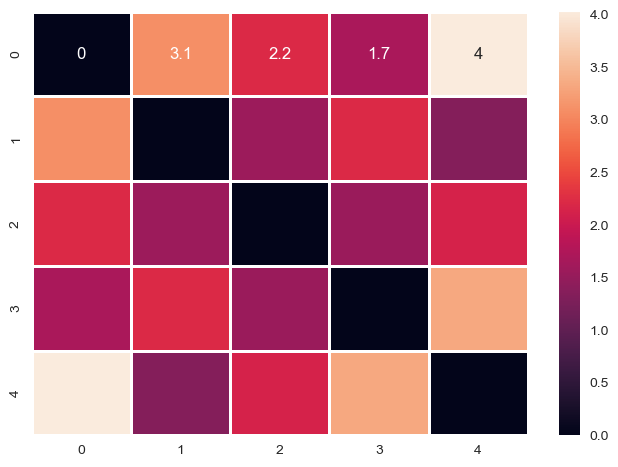

In [191]:
# Find the coordinates of each centroid using the cluster_centers_ attribute
centroids = my_kmeans.cluster_centers_

# Calculate the euclidean distance between the centroids
centroid_distances = pairwise_distances(centroids)

# Plot distances on heatmap
sns.heatmap(centroid_distances,
            annot=True,
            linewidths=1);

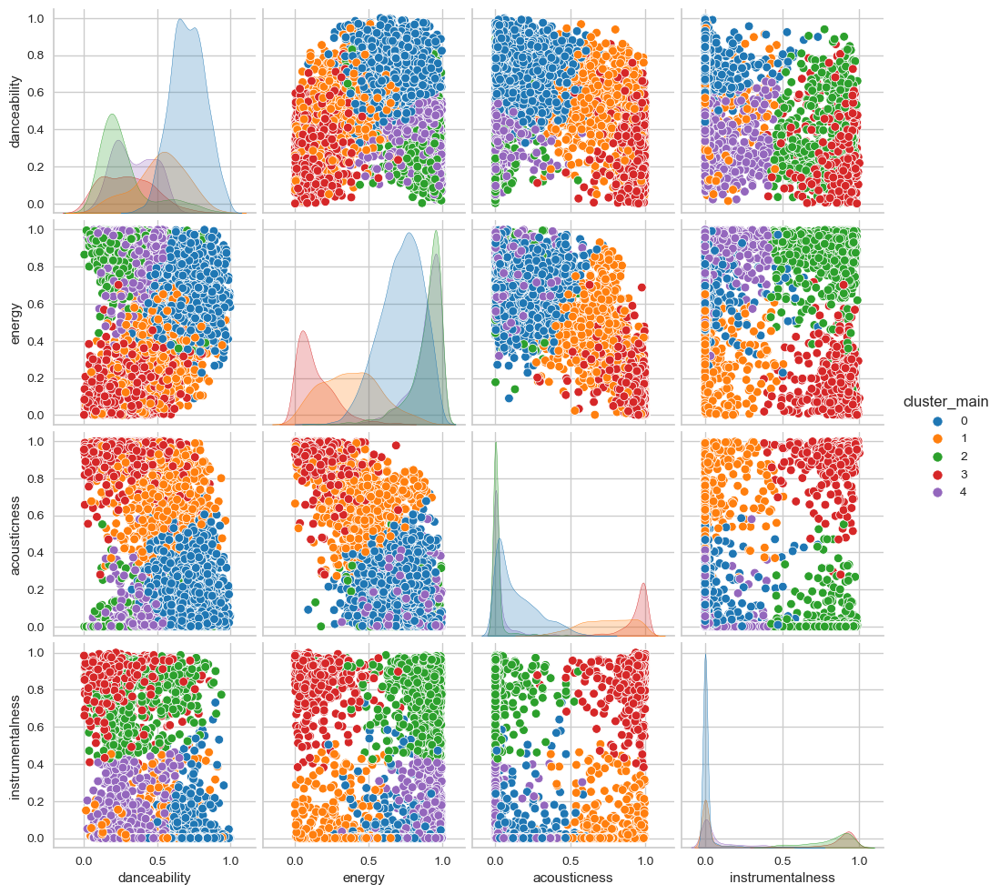

In [192]:
df3_minmax = df3_minmax.drop(columns="PCA - 0.95", axis=1)
sns.pairplot(df3_minmax, hue="cluster_main", palette="tab10")

In [193]:
# Save it for later
df3_minmax_cluster_main = df3_minmax["cluster_main"].reset_index()
df3_minmax_cluster_main.cluster_main.value_counts()

cluster_main
0    1982
2     882
4     833
1     824
3     601
Name: count, dtype: int64

In [194]:
coarse_metrics = ['danceability', 'energy', 'key', 'loudness', 'mode', 'speechiness', 'acousticness', 'instrumentalness', 'liveness', 'valence', 'tempo', 'cluster_main']

df3_new_new = df3.loc[:, coarse_metrics]
print(df3_new_new.columns)
scaler = MinMaxScaler().set_output(transform="pandas")
df3_minmax_new = scaler.fit_transform(df3_new_new)
df3_minmax_new


df_unused = df3_minmax_new.loc[:, ~df3_minmax_new.columns.isin(coarse_metrics)].copy()
df_coarse = df3_minmax_new.loc[:, df3_minmax_new.columns.isin(coarse_metrics)].copy()
df_coarse.describe()

Index(['danceability', 'energy', 'key', 'loudness', 'mode', 'speechiness',
       'acousticness', 'instrumentalness', 'liveness', 'valence', 'tempo',
       'cluster_main'],
      dtype='object')


,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,cluster_main
count,5122.000000,5122.000000,5122.000000,5122.000000,5122.000000,5122.000000,5122.000000,5122.000000,5122.000000,5122.000000,5122.000000,5122.000000
mean,0.494867,0.653624,0.479944,0.765904,0.646622,0.067223,0.291986,0.264771,0.179005,0.437016,0.507971,0.376952
std,0.240208,0.289542,0.324408,0.137206,0.478065,0.078812,0.358173,0.377647,0.153328,0.287921,0.186406,0.373728
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.271545,0.476989,0.181818,0.722032,0.000000,0.018120,0.002292,0.000001,0.083624,0.180651,0.359747,0.000000
50%,0.527221,0.738995,0.454545,0.809795,1.000000,0.036799,0.096285,0.002279,0.116894,0.407499,0.514154,0.250000
75%,0.692528,0.894998,0.727273,0.854917,1.000000,0.084878,0.570281,0.668020,0.231636,0.678890,0.611285,0.750000
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [195]:
df_coarse.cluster_main.value_counts()

cluster_main
0.00    1982
0.50     882
1.00     833
0.25     824
0.75     601
Name: count, dtype: int64

In [196]:
cluster_dataframes = {}  # Create an empty dictionary to store DataFrames

for cluster_value in df_coarse["cluster_main"].unique():
    df_cluster = df_coarse[df_coarse["cluster_main"] == cluster_value].copy()
    
    # Drop the 'cluster_main' column from the DataFrame
    df_cluster.drop(columns=["cluster_main"], inplace=True)
    
    cluster_dataframes[cluster_value] = df_cluster

In [197]:
cluster_dataframes[1]

,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo
id,,,,,,,,,,,
7CjSjWTdVPD0ov82Qz55Xb,0.425832,0.792996,0.181818,0.866923,1.0,0.103194,0.140562,0.000000,0.575863,0.912989,0.294011
2PIC7KxAgHGYCGuGqcorw7,0.507384,0.842997,0.545455,0.879798,1.0,0.014072,0.078715,0.025787,0.167094,0.632277,0.609700
5mt3HpjZuJNpqg1k415CnR,0.396077,0.855997,0.181818,0.851688,1.0,0.008041,0.009317,0.097868,0.115869,0.726538,0.738083
3VsYJCWecqxdwAN2Xu3cL5,0.299096,0.865997,0.818182,0.849895,1.0,0.025687,0.000416,0.024670,0.122016,0.339134,0.650730
1CDX9A7Gw2PJOVNij6z0Rx,0.451179,0.649993,0.000000,0.690369,1.0,0.018204,0.005954,0.000012,0.024690,0.607417,0.765195
...,...,...,...,...,...,...,...,...,...,...,...
4gQ8q2cDKHoaQsLLVfp9NH,0.148115,0.641993,1.000000,0.819118,1.0,0.038865,0.366466,0.000000,0.718267,0.253159,0.822827
51fegUPIH02heRh9fkkLwE,0.247300,0.496990,0.909091,0.793499,1.0,0.067568,0.104418,0.000000,0.054503,0.208618,0.897202
2yK4879j9Q1XnJio6ETqJV,0.493057,0.909998,0.909091,0.903821,0.0,0.253965,0.120482,0.000000,0.066694,0.500725,0.552758


In [198]:
wcss_dict = {}
sil_dict = {}

for cluster_value, df_cluster in cluster_dataframes.items():
    wcss = [] 
    sil_scores = []
    
    for num_clusters in range(2, 20): 
        kmeans = KMeans(n_clusters=num_clusters, init='k-means++', random_state=random_seed)
        kmeans.fit(df_cluster) 
        wcss.append(kmeans.inertia_)
        
        # Calculate the silhouette score
        score = silhouette_score(df_cluster, kmeans.labels_)
        sil_scores.append(score)
    
    wcss_dict[cluster_value] = wcss
    sil_dict[cluster_value] = sil_scores

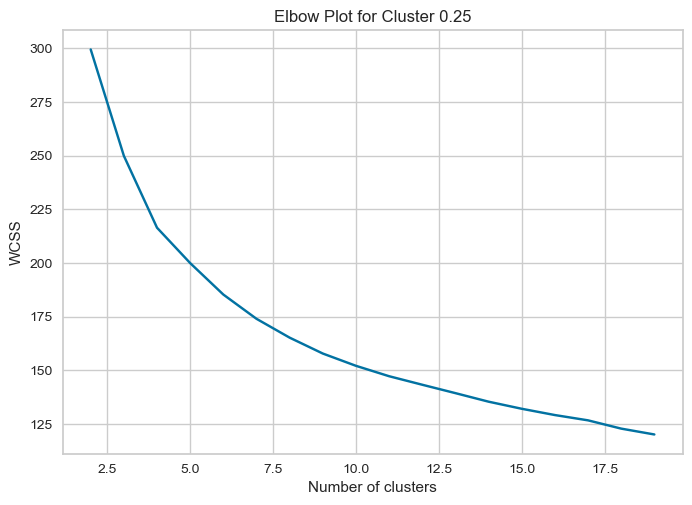

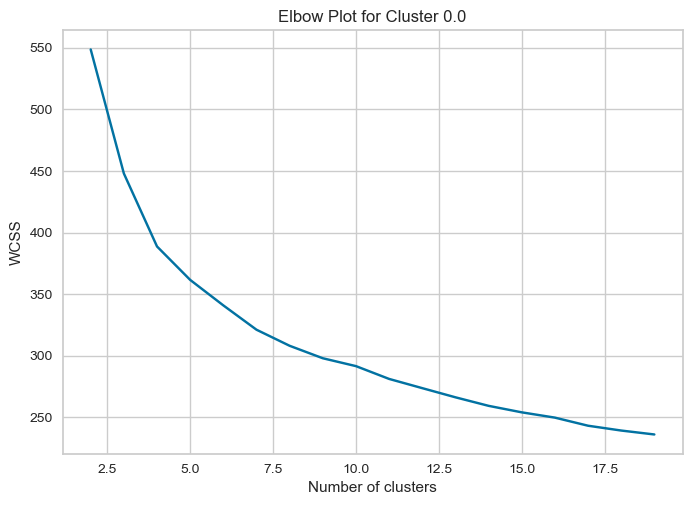

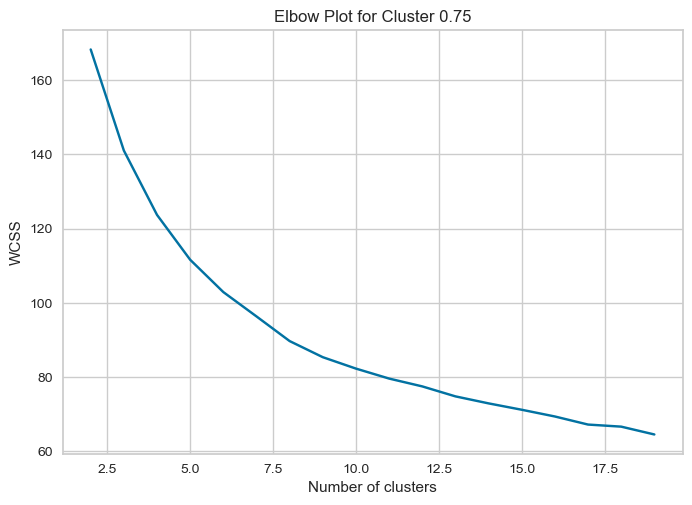

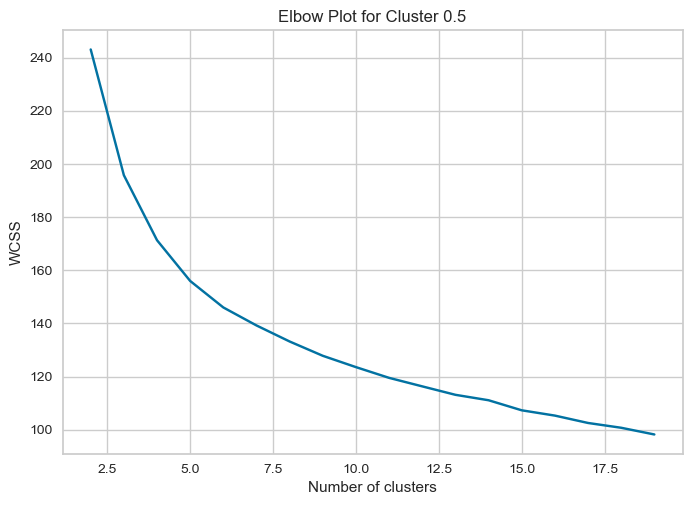

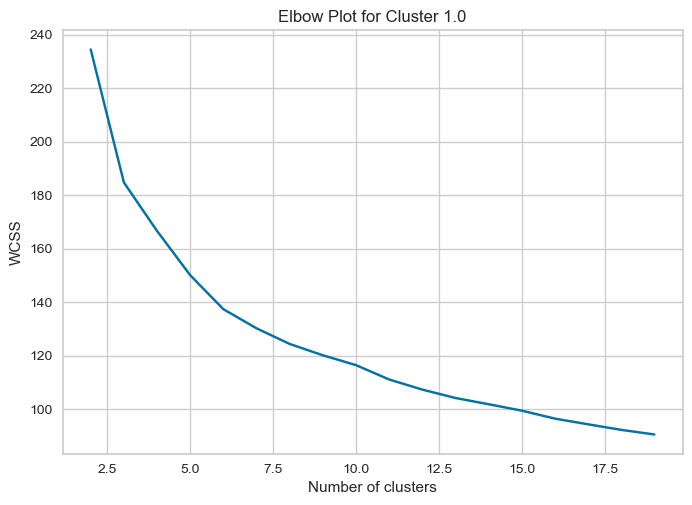

In [199]:
for cluster_value, wcss_values in wcss_dict.items():
    plt.plot(range(2, 20), wcss_values)  # Assuming 30 as the upper limit for the number of clusters
    plt.title(f'Elbow Plot for Cluster {cluster_value}')
    plt.xlabel('Number of clusters')
    plt.ylabel('WCSS')
    plt.show()

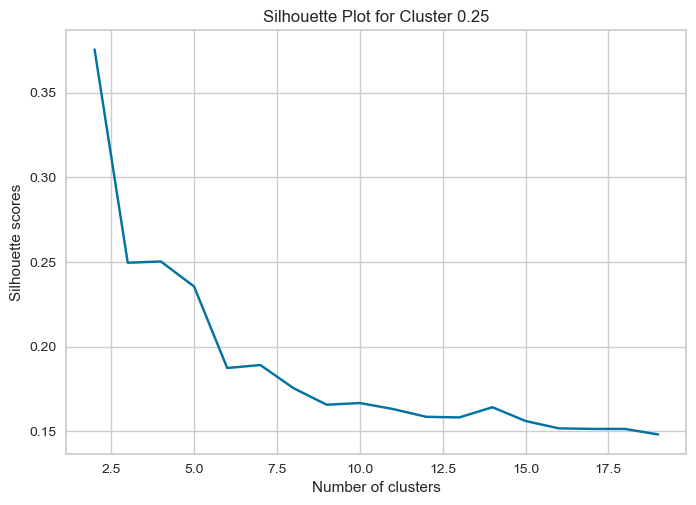

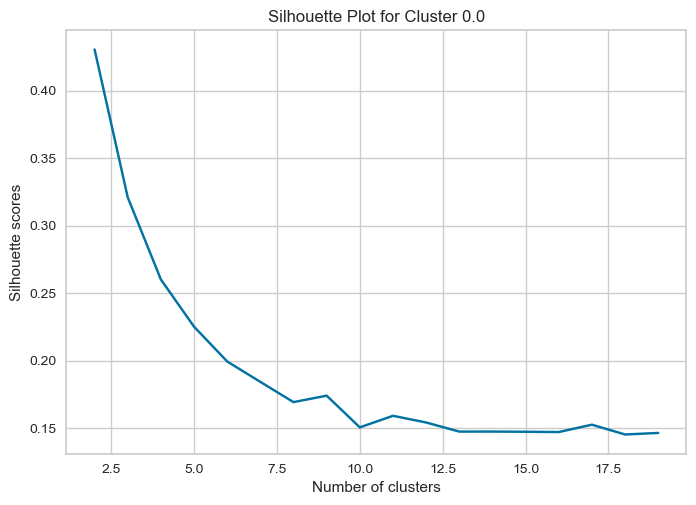

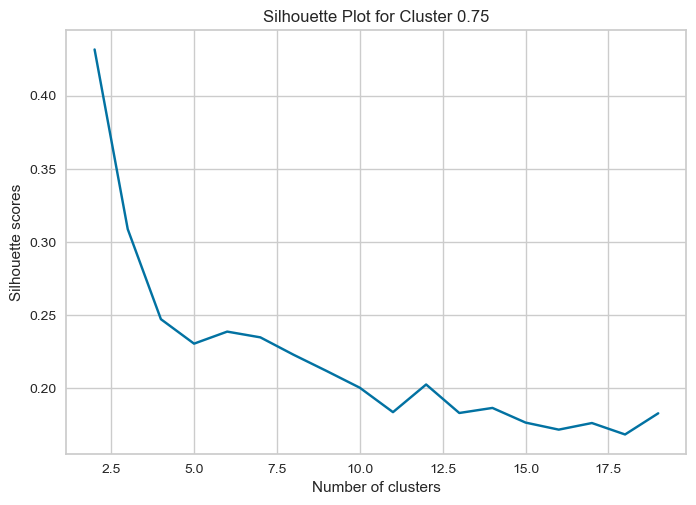

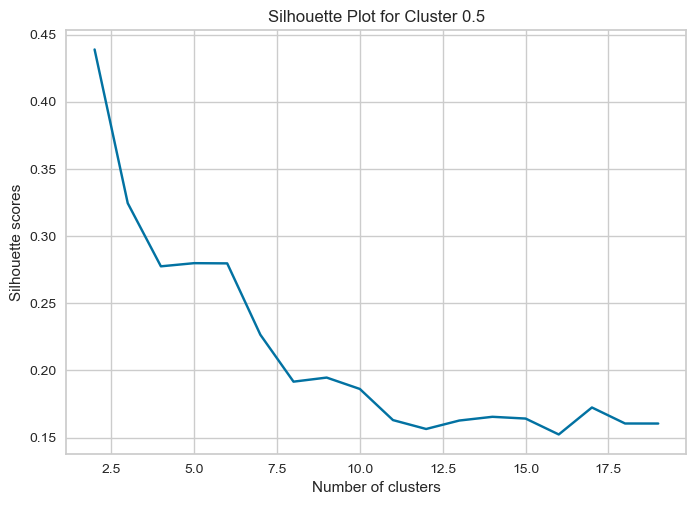

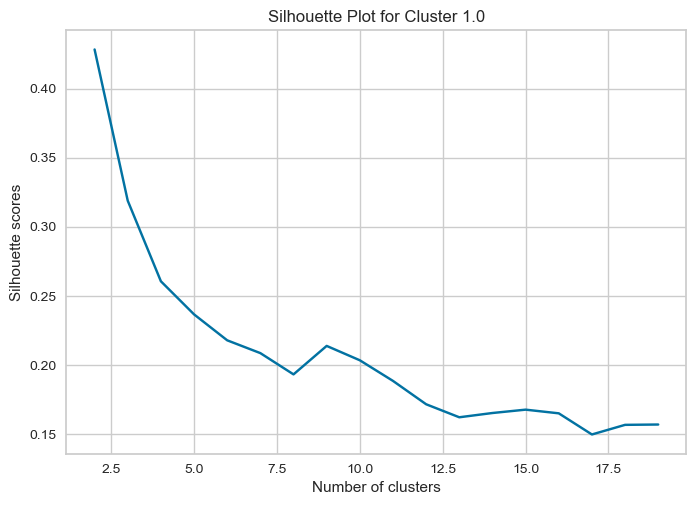

In [200]:
for cluster_value, sil_values in sil_dict.items():
    plt.plot(range(2, 20), sil_values)  # Assuming 30 as the upper limit for the number of clusters
    plt.title(f'Silhouette Plot for Cluster {cluster_value}')
    plt.xlabel('Number of clusters')
    plt.ylabel('Silhouette scores')
    plt.show()

In [201]:
for cluster_value, df_cluster in cluster_dataframes.items():
    my_kmeans = KMeans(n_clusters=5, init='k-means++', random_state=random_seed)
    my_kmeans.fit(df_cluster)
    
    # obtain the cluster output
    similarity_minmax = my_kmeans.labels_
    
    # attach the cluster output to the original DataFrame
    df_cluster["sub_cluster"] = similarity_minmax

In [202]:
cluster_dataframes[0]

,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,sub_cluster
id,,,,,,,,,,,,
5QGM1U0eCYrQuwSJwTm5Zq,0.752039,0.398988,0.181818,0.694238,1.0,0.013402,0.217871,0.000002,0.098453,0.697535,0.555779,1
0NLIFSZxPzQhCwnkn5PJYs,0.872162,0.729995,0.181818,0.729168,1.0,0.362296,0.454819,0.000064,0.115869,0.917133,0.343930,1
1wL2dk42Cxu4zCJs4SvFsZ,0.699140,0.545991,0.909091,0.720338,1.0,0.019433,0.399598,0.077157,0.145579,0.643671,0.859909,4
5iKuMCDh634YGrg2HrhtHp,0.677099,0.863997,0.090909,0.796428,1.0,0.017422,0.643574,0.363452,0.131237,0.534908,0.386495,1
1OzHkIzGMj4S3rWwF8TBjc,0.766365,0.731995,0.909091,0.760820,0.0,0.048247,0.488956,0.000924,0.453949,0.824943,0.305604,0
...,...,...,...,...,...,...,...,...,...,...,...,...
54PHTV8sTaZqYDLsLAmLDG,0.440159,0.602992,0.181818,0.824998,1.0,0.075385,0.185743,0.000000,0.261346,0.380568,0.671414,3
0Ek4F4tQB91pf5ybGQkBn0,0.484241,0.696994,0.727273,0.822112,1.0,0.075274,0.116466,0.000000,0.399652,0.430288,0.414918,4
6nvtHB8cv559sNsUDhoFhn,0.729998,0.926999,0.090909,0.828255,1.0,0.064105,0.001637,0.239594,0.656797,0.684069,0.494606,1


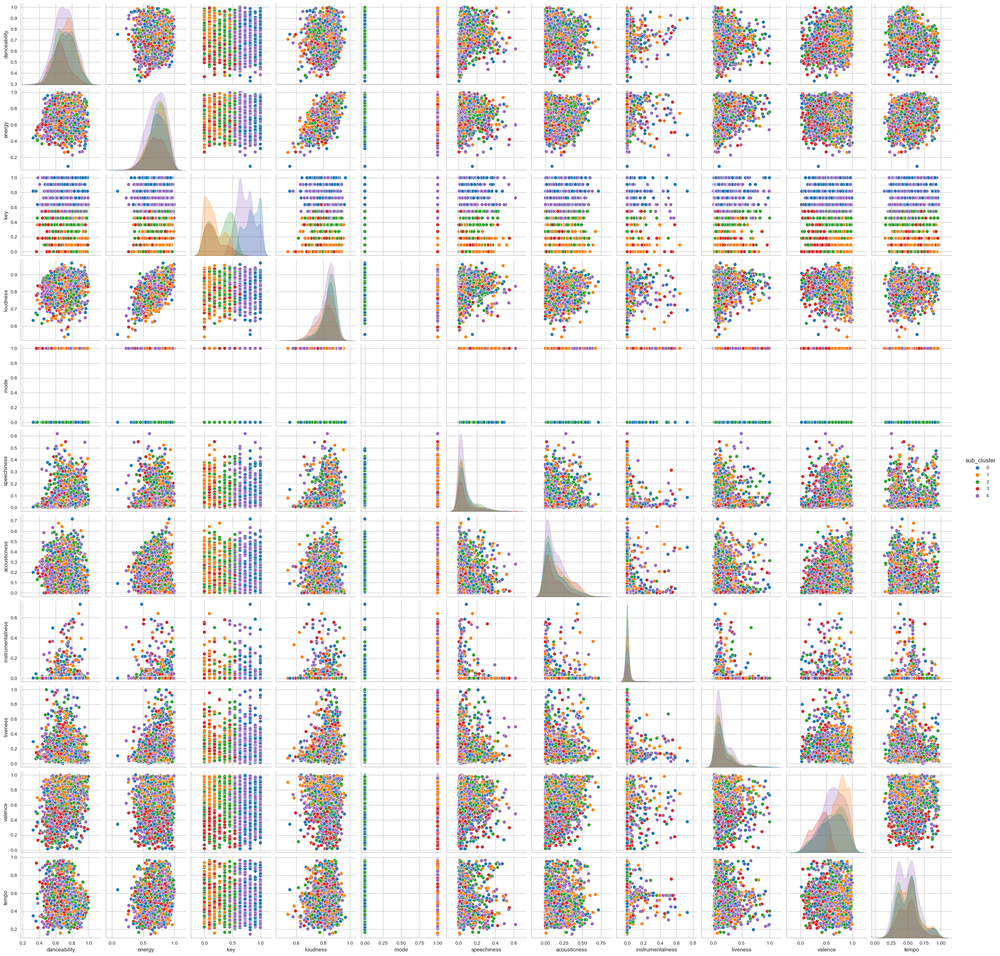

In [203]:
sns.pairplot(cluster_dataframes[0], hue="sub_cluster", palette="tab10")

In [204]:
df3_new.describe()

,danceability,energy,acousticness,instrumentalness,cluster_main
count,5122.000000,5122.000000,5122.000000,5122.000000,5122.000000
mean,0.508643,0.653631,0.290818,0.260800,1.507809
std,0.217964,0.289537,0.356740,0.371982,1.494910
min,0.059600,0.000020,0.000000,0.000000,0.000000
25%,0.306000,0.477000,0.002282,0.000001,0.000000
50%,0.538000,0.739000,0.095900,0.002245,1.000000
75%,0.688000,0.895000,0.568000,0.658000,3.000000
max,0.967000,1.000000,0.996000,0.985000,4.000000


In [205]:
df2.columns

Index(['name', 'artist', 'danceability', 'energy', 'key', 'loudness', 'mode',
       'speechiness', 'acousticness', 'instrumentalness', 'liveness',
       'valence', 'tempo', 'type', 'duration_ms', 'time_signature', 'html'],
      dtype='object')

In [206]:
df2_titles = df2[['name', 'artist']].reset_index()
df2_titles

,id,name,artist
0,1n7JnwviZ7zf0LR1tcGFq7,Se Eu Quiser Falar Com Deus,Gilberto Gil
1,5QGM1U0eCYrQuwSJwTm5Zq,Saudade De Bahia,Antônio Carlos Jobim
2,0NLIFSZxPzQhCwnkn5PJYs,"Canta Canta, Minha Gente",Martinho Da Vila
3,3mXqOdlLE1k67WsAxryPFs,Mulher Eu Sei,Chico César
4,7bSzjzjTkWT2CkIPPdp0eA,Rosa Morena,Kurt Elling
...,...,...,...
5166,1aEhYlZtypmipA06SDJ4U3,"1812 Festival Overture, Op. 49: 1812 Overture,...",Pyotr Ilyich Tchaikovsky
5167,1Gfqe7TAKklmuZf6hxsH6h,"Winter Fragments pour ensemble instrumental, s...",Tristan Murail
5168,2XNwnFrdMDpismp0VUZ7cU,"Schoenberg: 5 Orchestral Pieces, Op. 16: No. 3...",Arnold Schoenberg
5169,7ucDwgMtE3YJtEfTbuRhy0,"Serenade For Strings In E, Op.22, B. 52: 1. Mo...",Antonín Dvořák


In [207]:
cluster_dataframes[1]

,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,sub_cluster
id,,,,,,,,,,,,
7CjSjWTdVPD0ov82Qz55Xb,0.425832,0.792996,0.181818,0.866923,1.0,0.103194,0.140562,0.000000,0.575863,0.912989,0.294011,4
2PIC7KxAgHGYCGuGqcorw7,0.507384,0.842997,0.545455,0.879798,1.0,0.014072,0.078715,0.025787,0.167094,0.632277,0.609700,4
5mt3HpjZuJNpqg1k415CnR,0.396077,0.855997,0.181818,0.851688,1.0,0.008041,0.009317,0.097868,0.115869,0.726538,0.738083,4
3VsYJCWecqxdwAN2Xu3cL5,0.299096,0.865997,0.818182,0.849895,1.0,0.025687,0.000416,0.024670,0.122016,0.339134,0.650730,2
1CDX9A7Gw2PJOVNij6z0Rx,0.451179,0.649993,0.000000,0.690369,1.0,0.018204,0.005954,0.000012,0.024690,0.607417,0.765195,4
...,...,...,...,...,...,...,...,...,...,...,...,...
4gQ8q2cDKHoaQsLLVfp9NH,0.148115,0.641993,1.000000,0.819118,1.0,0.038865,0.366466,0.000000,0.718267,0.253159,0.822827,2
51fegUPIH02heRh9fkkLwE,0.247300,0.496990,0.909091,0.793499,1.0,0.067568,0.104418,0.000000,0.054503,0.208618,0.897202,2
2yK4879j9Q1XnJio6ETqJV,0.493057,0.909998,0.909091,0.903821,0.0,0.253965,0.120482,0.000000,0.066694,0.500725,0.552758,1


In [208]:
dataframes_list = list(cluster_dataframes.values())

# Concatenate the dataframes
final_df = pd.concat(dataframes_list).reset_index()
final_df

,id,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,sub_cluster
0,1n7JnwviZ7zf0LR1tcGFq7,0.659467,0.258985,1.000000,0.683418,0.0,0.053496,0.696787,0.000060,0.987706,0.296665,0.456665,1
1,3mXqOdlLE1k67WsAxryPFs,0.711263,0.050181,0.363636,0.574692,1.0,0.027362,0.882530,0.000041,0.384284,0.522478,0.432506,2
2,7bSzjzjTkWT2CkIPPdp0eA,0.651752,0.118982,0.545455,0.537707,1.0,0.017199,0.919679,0.000348,0.095380,0.396105,0.528079,3
3,5pstSsK0G4q86gdyy1Spqh,0.447873,0.145983,0.272727,0.588135,1.0,0.047241,0.934739,0.156345,0.098453,0.417858,0.676409,2
4,33u3dO0JWjerYpFN61J3ug,0.678201,0.206984,1.000000,0.668576,0.0,0.035627,0.966867,0.420305,0.103575,0.688212,0.342801,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...
5117,4gQ8q2cDKHoaQsLLVfp9NH,0.148115,0.641993,1.000000,0.819118,1.0,0.038865,0.366466,0.000000,0.718267,0.253159,0.822827,2
5118,51fegUPIH02heRh9fkkLwE,0.247300,0.496990,0.909091,0.793499,1.0,0.067568,0.104418,0.000000,0.054503,0.208618,0.897202,2
5119,2yK4879j9Q1XnJio6ETqJV,0.493057,0.909998,0.909091,0.903821,0.0,0.253965,0.120482,0.000000,0.066694,0.500725,0.552758,1
5120,3yJdWQxmFO7nvNjEybCeYE,0.475424,0.957999,0.909091,0.890902,1.0,0.132231,0.007490,0.000034,0.653724,0.336027,0.725186,2


In [209]:
df_final = final_df.merge(df2_titles, how="left", on="id").merge(df3_minmax_cluster_main, how="left", on="id")
df_final.head()

,id,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,sub_cluster,name,artist,cluster_main
0,1n7JnwviZ7zf0LR1tcGFq7,0.659467,0.258985,1.000000,0.683418,0.0,0.053496,0.696787,0.000060,0.987706,0.296665,0.456665,1,Se Eu Quiser Falar Com Deus,Gilberto Gil,1
1,3mXqOdlLE1k67WsAxryPFs,0.711263,0.050181,0.363636,0.574692,1.0,0.027362,0.882530,0.000041,0.384284,0.522478,0.432506,2,Mulher Eu Sei,Chico César,1
2,7bSzjzjTkWT2CkIPPdp0eA,0.651752,0.118982,0.545455,0.537707,1.0,0.017199,0.919679,0.000348,0.095380,0.396105,0.528079,3,Rosa Morena,Kurt Elling,1
3,5pstSsK0G4q86gdyy1Spqh,0.447873,0.145983,0.272727,0.588135,1.0,0.047241,0.934739,0.156345,0.098453,0.417858,0.676409,2,Desafinado,Stan Getz,1
4,33u3dO0JWjerYpFN61J3ug,0.678201,0.206984,1.000000,0.668576,0.0,0.035627,0.966867,0.420305,0.103575,0.688212,0.342801,1,Madalena,Maria Gasolina,1


In [210]:
desired_order = ['name', 'artist', 'cluster_main', 'sub_cluster', 'danceability', 'energy', 'key', 'loudness', 'mode', 'speechiness', 'acousticness', 'instrumentalness', 'liveness', 'valence', 'tempo', 'id']

# Assuming df_final is your DataFrame
df_final = df_final[desired_order]

df_final[df_final["artist"].str.contains(re.compile(r'beethoven', flags=re.IGNORECASE))]

,name,artist,cluster_main,sub_cluster,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,id
612,Fidelio op.72 - Edited Helga Lühning & Robert ...,Ludwig van Beethoven,1,3,0.119462,0.014380,0.909091,0.342157,1.0,0.021331,0.942771,0.001949,0.070075,0.021235,0.385988,6bnDla4VOr2JBtyK3AeZEJ
2844,I. Adagio sostenuto,Ludwig van Beethoven,3,3,0.089707,0.001210,0.090909,0.012132,0.0,0.022671,0.997992,0.956345,0.101526,0.067019,0.238867,4tQoPPpXKILHrBO9w3dnLr
2894,Beethoven Variation (After String Quartet No. ...,Ludwig van Beethoven,3,1,0.549262,0.256985,0.909091,0.578014,0.0,0.021443,0.988956,0.902538,0.095380,0.426145,0.545410,7wgB3W8gPZMmlrLyd2VI5R
2948,II. Adagio cantabile,Ludwig van Beethoven,3,4,0.192197,0.003020,0.727273,0.165013,1.0,0.031606,0.998996,0.924873,0.084622,0.069298,0.136927,6q81HMOluDuPl4RRixEhCO
3053,Piano Sonata No. 14 (quasi una Fantasia) in C-...,Ludwig van Beethoven,3,3,0.130483,0.003070,0.090909,0.076047,0.0,0.021778,0.996988,0.909645,0.119967,0.050963,0.168237,7GAGE2KQ0I548pZwXJVhCP
3085,"Piano Sonata No. 28 in A Major, Op. 101: I. Et...",Ludwig van Beethoven,3,2,0.370730,0.008520,0.363636,0.312801,1.0,0.060532,0.997992,0.942132,0.074890,0.059872,0.139915,3Ab2FlAiubuhaXQHPXZxm0
3104,Diabelli Variations - 33 Variations on a Waltz...,Ludwig van Beethoven,3,2,0.243994,0.018480,0.000000,0.164663,1.0,0.026022,1.000000,0.885279,0.093331,0.303915,0.226889,6ktfNaraJuHmJ3BNeRLw4o
3136,Diabelli Variations - 33 Variations on a Waltz...,Ludwig van Beethoven,3,2,0.333260,0.015780,0.000000,0.232338,1.0,0.020103,0.996988,0.948223,0.099478,0.322561,0.189550,2NPoTBCs2YKz4jxxyNRuJf
3331,"Beethoven: Symphony No. 7 in A Major, Op. 92: ...",Ludwig van Beethoven,3,4,0.255014,0.136982,0.818182,0.569686,1.0,0.018204,0.930723,0.778680,0.323840,0.065362,0.403522,3UkIZn9Brm9kwriMOkPShv
3362,"Beethoven: Symphony No. 3 in E-Flat Major, Op....",Ludwig van Beethoven,3,2,0.208728,0.067481,0.272727,0.542778,1.0,0.017981,0.953815,0.815228,0.282860,0.138181,0.253393,1S432DERcJ0B0JfQRnqkzl


In [211]:
df_final[df_final["artist"].str.contains(re.compile(r'grönemeyer', flags=re.IGNORECASE))]

,name,artist,cluster_main,sub_cluster,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,id
758,Der Weg,Herbert Grönemeyer,1,2,0.313423,0.243985,0.454545,0.733409,1.0,0.017199,0.924699,0.000078,0.110747,0.177543,0.672861,7AKqM1fV3UuVDvmfPlGqiU
770,Glück,Herbert Grönemeyer,1,1,0.519506,0.506990,0.090909,0.837457,0.0,0.010610,0.706827,0.000041,0.110747,0.428216,0.682094,0BWuJ7XmWto1HyfJZaPhyf
2472,Mensch,Herbert Grönemeyer,0,0,0.685916,0.780996,1.000000,0.848999,0.0,0.063770,0.027309,0.001513,0.067514,0.875699,0.886900,2urspvjqMlyq8JVAudN3DK
2509,"Zeit, dass sich was dreht - Deutsche Version",Herbert Grönemeyer,0,2,0.523914,0.833997,0.181818,0.863448,0.0,0.058298,0.416667,0.000000,0.055732,0.410607,0.547688,2ln6685JphEqCJYclkusqW
2522,Stück vom Himmel,Herbert Grönemeyer,0,3,0.525017,0.691994,0.000000,0.854682,1.0,0.012397,0.089759,0.000000,0.096404,0.225192,0.311958,3wrSpPwnR9CkrCq9EHbFiQ
2570,Komm zur Ruhr,Herbert Grönemeyer,0,3,0.486445,0.513990,0.636364,0.786155,1.0,0.020996,0.141566,0.000354,0.095380,0.061425,0.325754,3iFtSsKfDjR00VE9GERKuj


In [212]:
df_final[df_final["artist"].str.contains(re.compile(r'obituary', flags=re.IGNORECASE))]

,name,artist,cluster_main,sub_cluster,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,id
3575,Chopped in Half,Obituary,2,2,0.217545,0.989000,0.909091,0.841305,0.0,0.071588,0.000007,0.528934,0.258273,0.378496,0.449169,01cGujYWGF7JchJLSgf6Ta
3581,Redneck Stomp,Obituary,2,3,0.204320,0.860997,0.181818,0.779881,1.0,0.021108,0.000257,0.884264,0.210122,0.480008,0.326071,2fSYadDsbWMtIVqX7flKIc
3839,Dying,Obituary,2,3,0.272647,0.965999,0.090909,0.797980,1.0,0.061090,0.000004,0.744162,0.141481,0.203439,0.616635,3BTNi1JH6f6tSPPtbHMLhM
3996,Threatening Skies,Obituary,2,0,0.197708,0.920998,0.818182,0.831687,1.0,0.023342,0.000002,0.544162,0.371991,0.638492,0.737400,6z2kUtd7DNAkpdY0EHHzfV
4656,Slowly We Rot,Obituary,4,0,0.237382,0.946999,0.000000,0.824298,1.0,0.068014,0.000011,0.009827,0.115869,0.066190,0.434521,5F6ZrWLngDICyjazxM1gNq
4678,Body Bag,Obituary,4,2,0.278157,0.988000,0.818182,0.831927,1.0,0.137816,0.000020,0.032386,0.217293,0.030143,0.468575,5oXLtUCb5sEXR1lCuc1HVP
4681,Infected,Obituary,4,2,0.281464,0.981000,0.818182,0.842397,1.0,0.157918,0.000117,0.006954,0.643479,0.041537,0.595214,2e83Z7NX9uVK6xtIcLNPT7
4705,Internal Bleeding,Obituary,4,0,0.188891,0.964999,0.000000,0.820998,1.0,0.205941,0.000230,0.003239,0.161971,0.012119,0.698939,100WXBiJbtUUQX9KWZPNLb
4706,Godly Beings,Obituary,4,0,0.202116,0.982000,0.454545,0.832539,1.0,0.154568,0.000007,0.011472,0.058293,0.029107,0.509619,31eWx2iRxDKYAXJNYuyVec
4707,Cause of Death,Obituary,4,1,0.247300,0.978000,0.818182,0.797303,0.0,0.127764,0.000024,0.007655,0.112796,0.044438,0.662032,63tdOio6UnzHHgtBtQt2In


In [213]:
df_final[df_final["name"].str.contains(re.compile(r'dog guts', flags=re.IGNORECASE))]

,name,artist,cluster_main,sub_cluster,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,id
4948,Dog Guts,MACABRE,4,0,0.324443,0.985,0.363636,0.899362,1.0,0.088675,0.000006,0.013299,0.316668,0.180651,0.431006,0OrhG4863RMrTmfEwjDx2N


In [214]:
# Assuming df_final is your DataFrame
df_final.to_csv('df_final.csv', index=False)

In [215]:
df_final[df_final["artist"].str.contains(re.compile(r'Taylor Swift', flags=re.IGNORECASE))]

,name,artist,cluster_main,sub_cluster,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,id
1010,ME! (feat. Brendon Urie of Panic! At The Disco),Taylor Swift,0,1,0.610976,0.838997,0.000000,0.880104,1.0,0.053161,0.029217,0.000000,0.103575,0.660244,0.941639,4Sib57MmYGJzSvkW84jTwh
1077,Look What You Made Me Do,Taylor Swift,0,0,0.786202,0.679994,0.818182,0.831249,0.0,0.132231,0.213855,0.000016,0.113820,0.494510,0.576213,6uFsE1JgZ20EXyU0JQZbUR
1549,Love Story,Taylor Swift,0,3,0.615385,0.740995,0.181818,0.884323,1.0,0.009381,0.170683,0.000000,0.073046,0.286306,0.514851,1vrd6UOGamcKNGnSHJQlSt
1555,I Knew You Were Trouble,Taylor Swift,0,4,0.484241,0.466989,0.545455,0.823249,1.0,0.026245,0.005954,0.000002,0.025817,0.639528,0.229438,6RjKVXi31fui9m4dbiGRrL
1561,We Are Never Ever Getting Back Together,Taylor Swift,0,4,0.621997,0.684994,0.636364,0.841654,1.0,0.108778,0.010542,0.000023,0.117918,0.788689,0.292294,1F6oGPF75u9RuHH4BGx9Bf
1658,Wildest Dreams,Taylor Swift,0,4,0.543751,0.663993,0.727273,0.808538,1.0,0.057516,0.071185,0.005685,0.097429,0.463435,0.657314,3fVnlF4pGqWI9flVENcT28
1661,Blank Space,Taylor Swift,0,4,0.763059,0.677993,0.454545,0.852168,1.0,0.046906,0.085341,0.000002,0.122016,0.583592,0.359551,2ls70nUDfjzm1lSRDuKxmw
1669,I Knew You Were Trouble,Taylor Swift,0,4,0.597752,0.464989,0.545455,0.822856,1.0,0.015747,0.005743,0.000005,0.022641,0.667495,0.752055,21K6jcmZPktm7MftqfLfLg
1690,We Are Never Ever Getting Back Together,Taylor Swift,0,4,0.626405,0.675993,0.636364,0.841458,1.0,0.077061,0.009608,0.000027,0.112796,0.756578,0.291787,6kISMRfweKSvgHR0urMQFG
1704,Bad Blood,Taylor Swift,0,4,0.652854,0.801996,0.636364,0.837020,1.0,0.176904,0.087450,0.000007,0.140457,0.285270,0.860754,0TvQLMecTE8utzoNmvXRbK


### Pick out artists shown in more than 3 clusters

In [216]:
# Count the occurrences of each song in clusters
artist_cluster_counts = df_final.groupby('artist')['cluster_main'].nunique()

# Filter songs present in more than 3 clusters
artist_in_more_than_3_clusters = artist_cluster_counts[artist_cluster_counts > 3].index.tolist()
artist_in_more_than_3_clusters

['Fleetwood Mac', 'Gilberto Gil', 'The Magnetic Fields']

### Pick out artists shown only in the same cluster-subcluster

In [222]:
# Specify the cluster and sub-cluster of your choice
selected_cluster = 1
selected_sub_cluster = 4

# Filter out artists only in the specified cluster and sub-cluster
filtered_artists = df_final[(df_final['cluster_main'] == selected_cluster) & (df_final['sub_cluster'] == selected_sub_cluster)]['artist'].unique()

# Check if these artists are not present in any other cluster-subcluster combinations
for artist in filtered_artists:
    other_clusters = df_final[(df_final['artist'] == artist) & ~((df_final['cluster_main'] == selected_cluster) & (df_final['sub_cluster'] == selected_sub_cluster))]
    if not other_clusters.empty:
        # If the artist is present in other clusters, remove from the filtered_artists list
        filtered_artists = filtered_artists[filtered_artists != artist]

print("Artists only in cluster {} and sub-cluster {}: {}".format(selected_cluster, selected_sub_cluster, filtered_artists))

Artists only in cluster 1 and sub-cluster 4: ['Devendra Banhart' 'Zé Maurício Machline' 'Os Tincoãs' 'Zezé Motta'
 'Great Lake Swimmers' 'Luthea Salom' 'Rodríguez' 'The xx' 'Ben Lee'
 'The Honeys' 'The Shins' 'Trío Page Cavanaugh' 'Isaac Ulam' 'Rufus'
 'Aias' 'Academia da Berlinda' 'Kou Keri Kou' 'Joan Manuel Serrat'
 'Saintseneca' 'Umpah Pah' 'Chuck Wood' 'Tommy Edwards' 'The Big Bopper'
 'The Poni-Tails' 'Connie Francis' 'Frankie Lymon & The Teenagers'
 'Pat Boone' 'Tony Bennett' 'Mickey & Sylvia' 'Petula Clark'
 'Stone Poneys' 'The Shirelles' 'Peter Sarstedt' 'The Temptations' 'Lulu'
 'Procol Harum' 'The Cascades' 'Cheap Trick' 'Lou Reed' 'Seals and Crofts'
 'Ace Frehley' 'Joe Cocker' 'Meat Loaf' 'All Saints' 'East 17'
 'Lewis Capaldi' 'JP Saxe' 'Lorez Alexandria' 'Dizzy Gillespie'
 'Thelonious Monk Trio' 'Flume' 'The Jamaicans' 'Stefan Raab'
 'Manuel Turizo' 'Tramaine Hawkins' 'Richard Smallwood']


In [217]:
import re 
df_final[df_final["artist"].str.contains(re.compile(r'sinatra', flags=re.IGNORECASE))]

,name,artist,cluster_main,sub_cluster,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,id
140,Ain't No Sunshine,Nancy Sinatra,1,1,0.272647,0.244985,0.909091,0.716665,0.0,0.008264,0.884538,0.007736,0.237783,0.242801,0.652089,2XTaMoUqPlJL8PLQnVNvlD
242,I've Got You Under My Skin - Remastered 1998,Frank Sinatra,1,4,0.579017,0.246985,0.090909,0.694981,1.0,0.019433,0.453815,0.000009,0.098453,0.591879,0.570049,3aEJMh1cXKEjgh52claxQp
269,I Get A Kick Out Of You,Frank Sinatra,1,1,0.369628,0.374987,0.454545,0.730961,0.0,0.017311,0.557229,0.000000,0.578937,0.782474,0.914479,3mKdw0slI6wmnb1FBrvwn2
301,You Make Me Feel So Young - Remastered 1998,Frank Sinatra,1,0,0.570201,0.305986,0.818182,0.717999,1.0,0.022448,0.384538,0.000000,0.173240,0.568055,0.556638,2WaYW84yWij5NSCpgSeU2R
318,Love & Marriage,Frank Sinatra,1,0,0.694732,0.243985,0.909091,0.751836,1.0,0.015412,0.922691,0.000000,0.212171,0.599130,0.460727,1jdE62HRy0U5vJaOZ0LUUb
338,Come Fly With Me - Remastered 1998,Frank Sinatra,1,3,0.566894,0.337987,0.545455,0.721999,1.0,0.021666,0.848394,0.000000,0.157873,0.490367,0.163519,4hHbeIIKO5Y5uLyIEbY9Gn
348,Love Is Here To Stay - Remastered 1998,Frank Sinatra,1,3,0.537139,0.207984,0.818182,0.676489,1.0,0.012062,0.678715,0.000000,0.091282,0.418894,0.447357,3YCbx1QqGrnxMsPEZLC1CT
626,You Go To My Head - 2020 Mix,Frank Sinatra,1,1,0.096319,0.214984,0.272727,0.651657,0.0,0.013402,0.968876,0.000942,0.177338,0.085353,0.869562,7KsJkshpIjjeIwyKnkhQUc
703,Fly Me To The Moon,Frank Sinatra,1,4,0.672691,0.364987,0.000000,0.748623,1.0,0.037748,0.527108,0.000000,0.047741,0.445826,0.517284,2dR5WkrpwylTuT3jRWNufa
